In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
import datetime 
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose 
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
import statsmodels.api as sm
from datetime import timedelta
import warnings
warnings.filterwarnings("ignore")
import math

In [3]:
data = pd.read_csv('pharma/saleshourly.csv',parse_dates=['datum'],index_col='datum')

In [3]:
data.head()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
datum,,,,,,,,,,,,
2014-01-02 08:00:00,0.0,0.67,0.4,2.0,0.0,0.0,0.0,1.0,2014,1,8,Thursday
2014-01-02 09:00:00,0.0,0.00,1.0,0.0,2.0,0.0,0.0,0.0,2014,1,9,Thursday
2014-01-02 10:00:00,0.0,0.00,0.0,3.0,2.0,0.0,0.0,0.0,2014,1,10,Thursday
2014-01-02 11:00:00,0.0,0.00,0.0,2.0,1.0,0.0,0.0,0.0,2014,1,11,Thursday
2014-01-02 12:00:00,0.0,2.00,0.0,5.0,2.0,0.0,0.0,0.0,2014,1,12,Thursday


In [3]:
cols = ["M01AB","M01AE","N02BA","N02BE","N05B","N05C","R03","R06"]

In [52]:
def plot_graph(data,cols):
    fig = plt.figure(figsize=(30, 30))
    for loc, col in enumerate(cols):
        plt.subplot(4, 2, loc+1)
        plt.plot(data[col])
        plt.title(col)

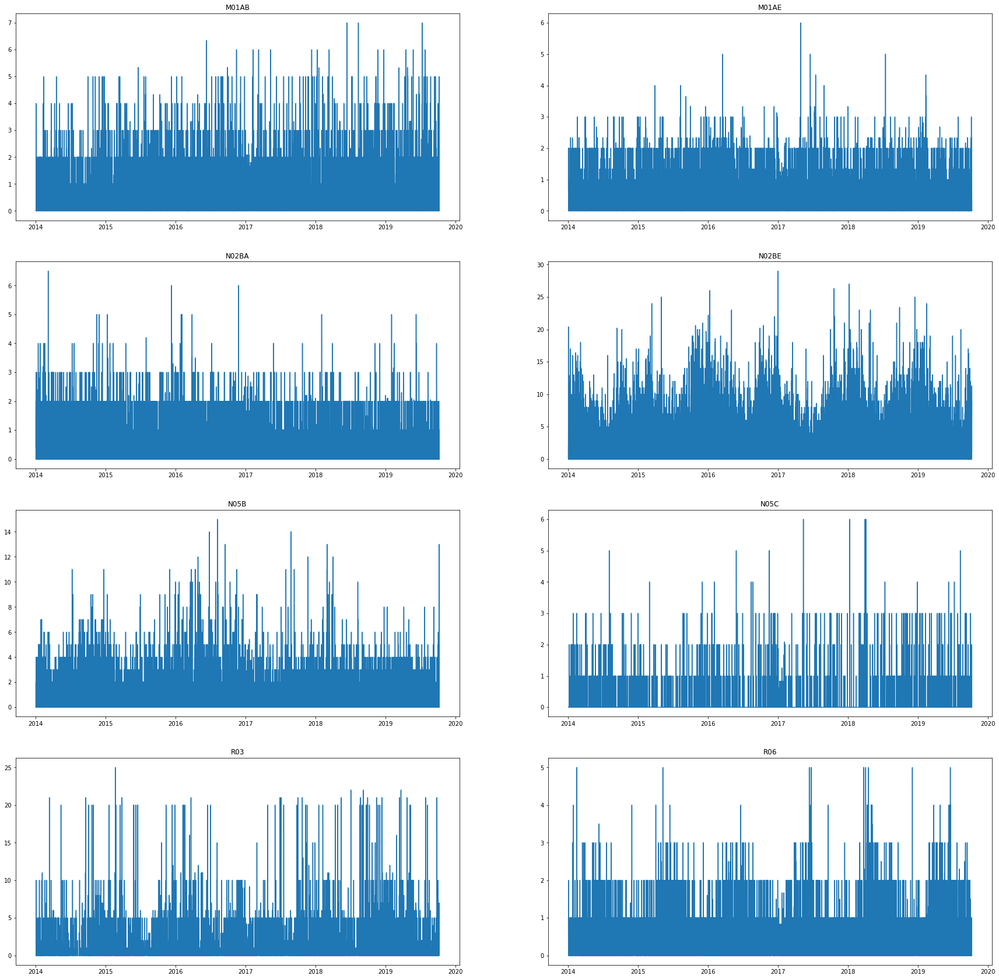

In [53]:
plot_graph(data,cols)

## Rolling Average

In [11]:
years = [2014,2015,2016,2017,2018,2019]

In [5]:
def rolling_avg_graph(data,col):
    fig = plt.figure(figsize=(20, 20))
    for loc,year in enumerate(years):
        plt.subplot(6, 1,loc+1)
        year_mask = data['Year'] == year
        mask_data = data[year_mask]
        arr_mean = mask_data[col].rolling(24).mean()
        arr_std = mask_data[col].rolling(24).std()
        sns.lineplot(x = mask_data.index,y = col,data = mask_data,label = 'HourlySales')
        sns.lineplot(x = mask_data.index,y = arr_mean,data = mask_data,label = 'RollingAvgSales')
        sns.lineplot(x = mask_data.index,y = arr_std,data = mask_data,label = 'RollingStdSales')
        plt.title(col,fontsize=20)

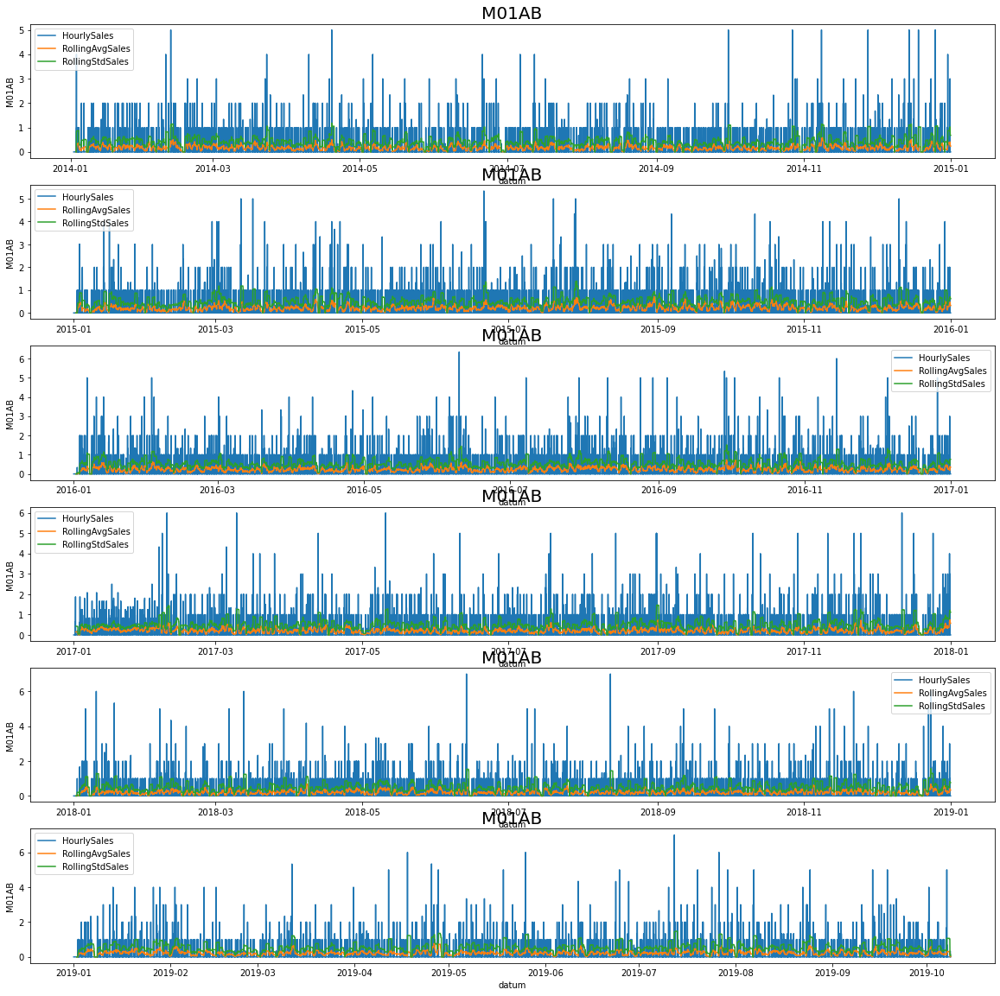

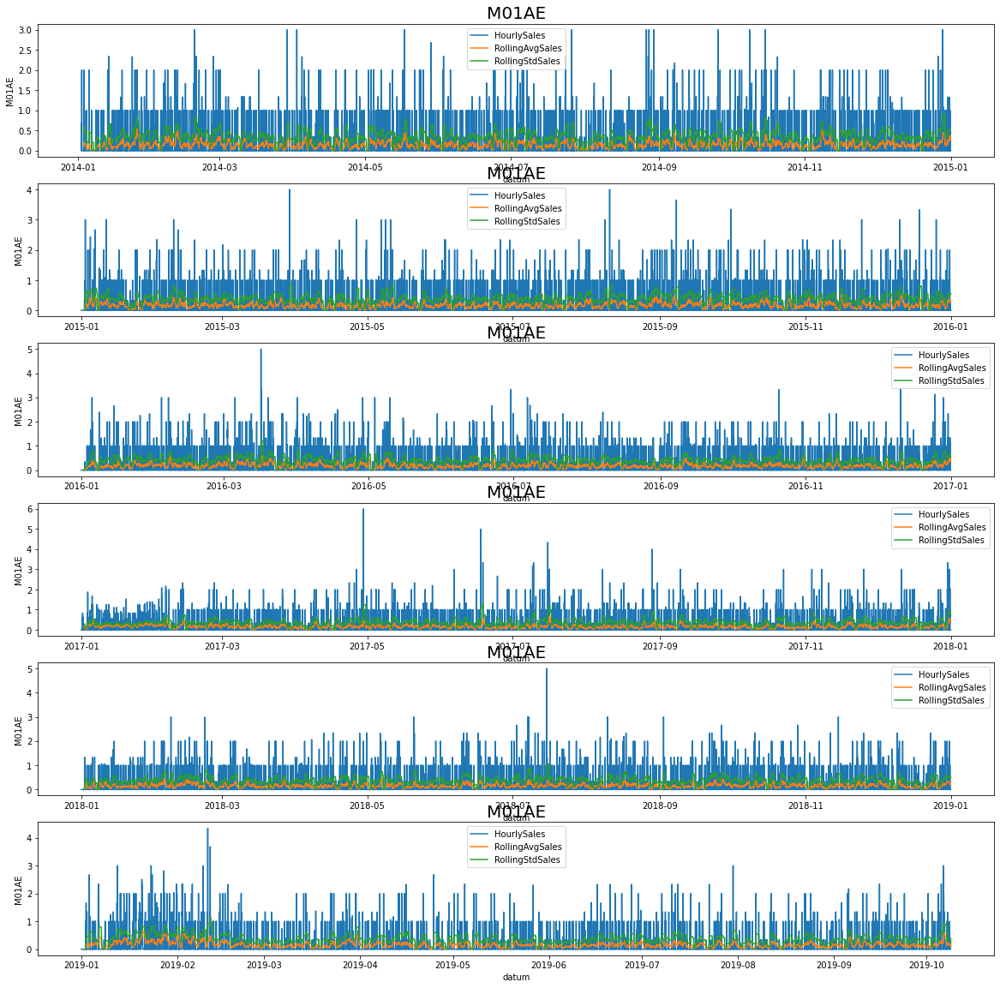

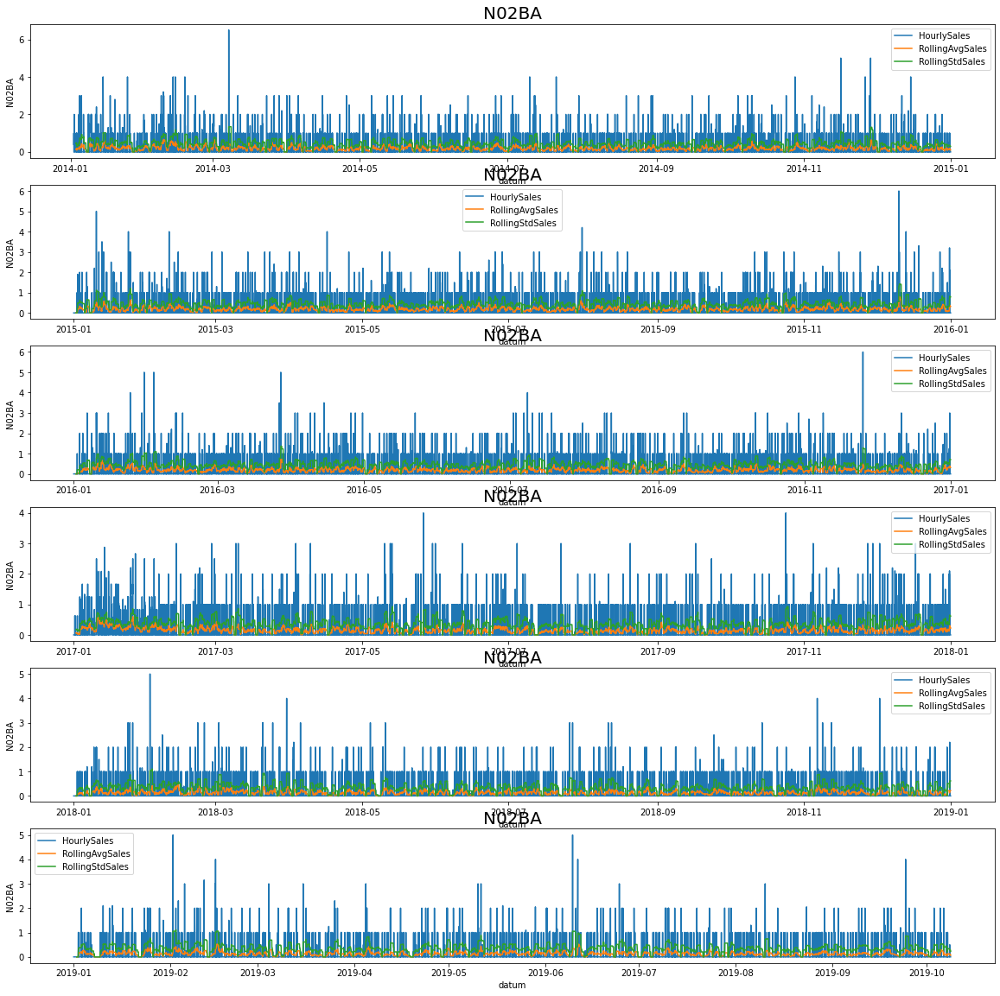

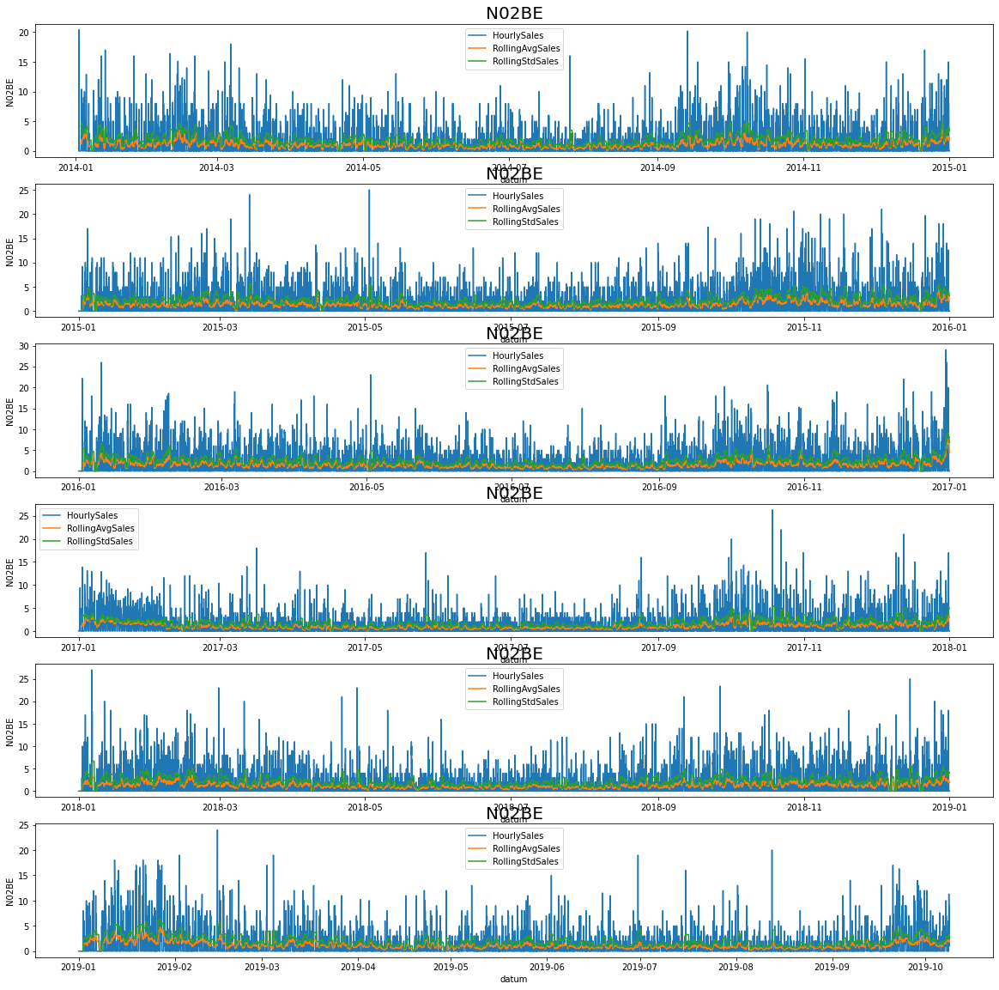

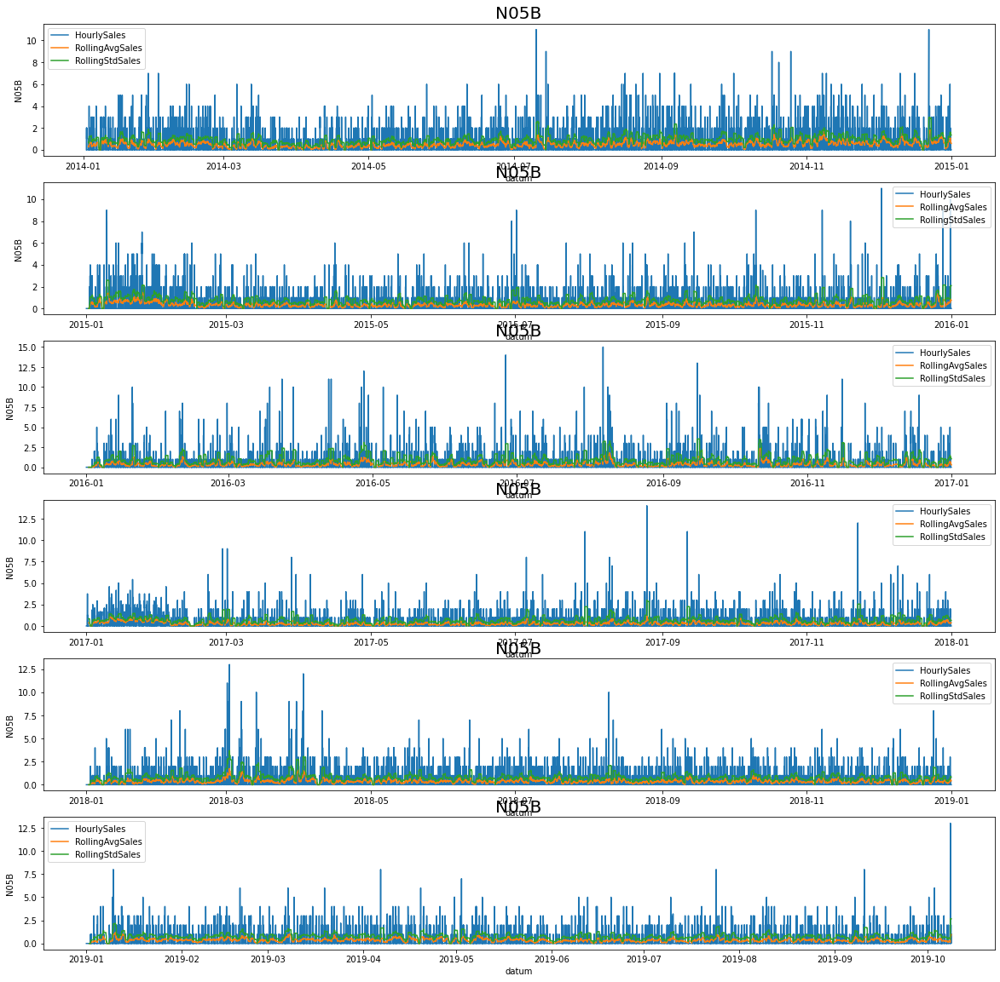

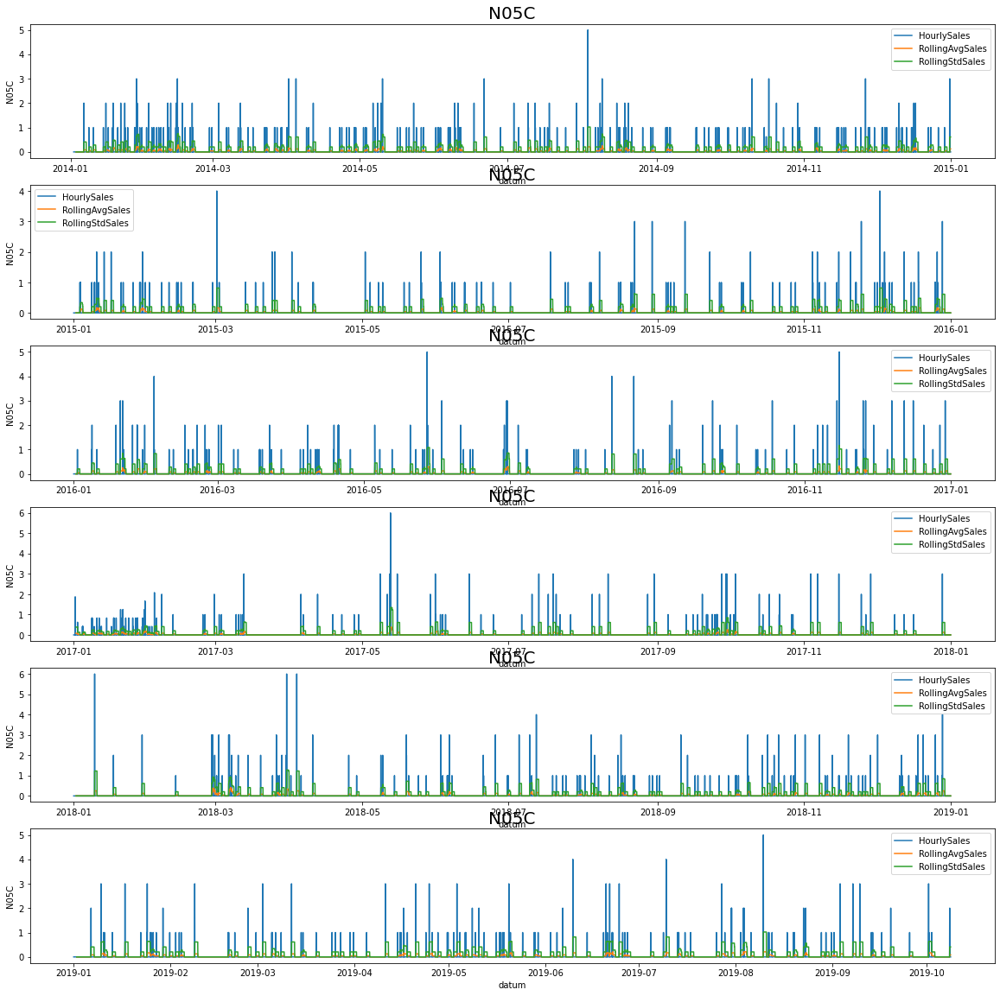

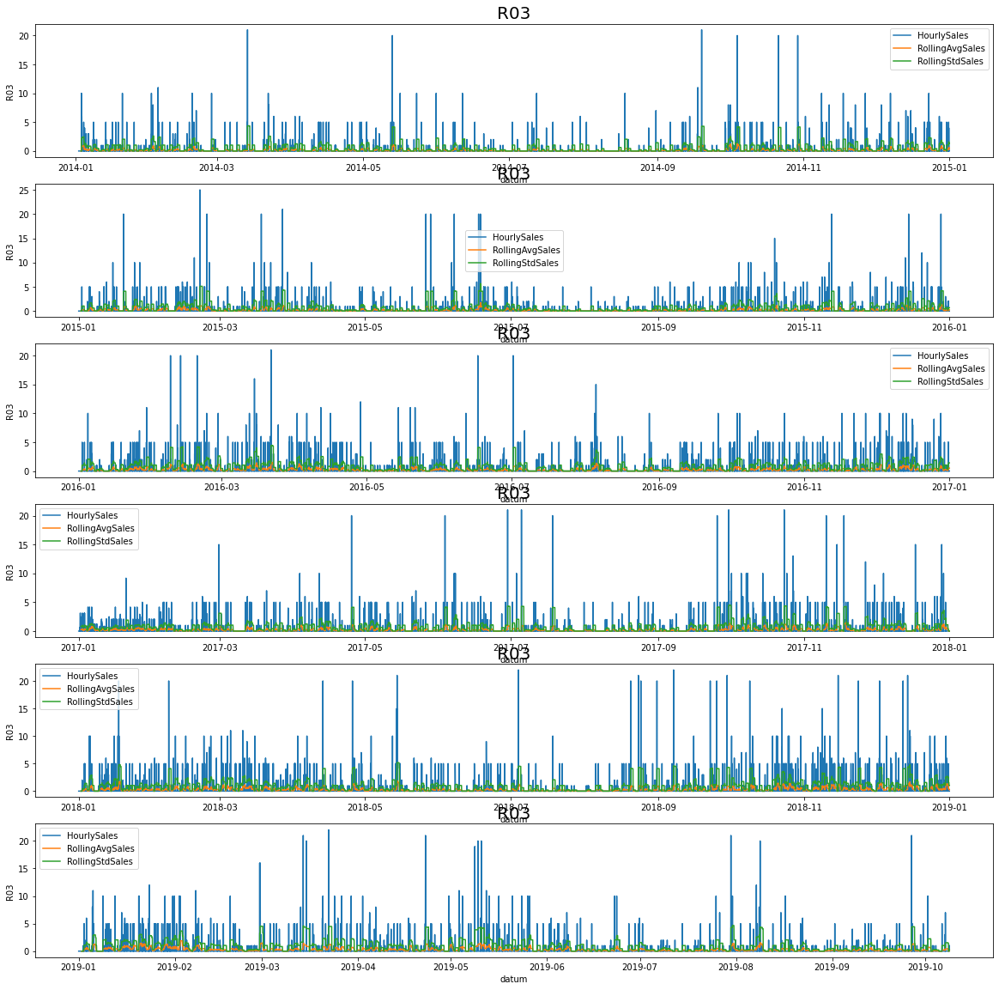

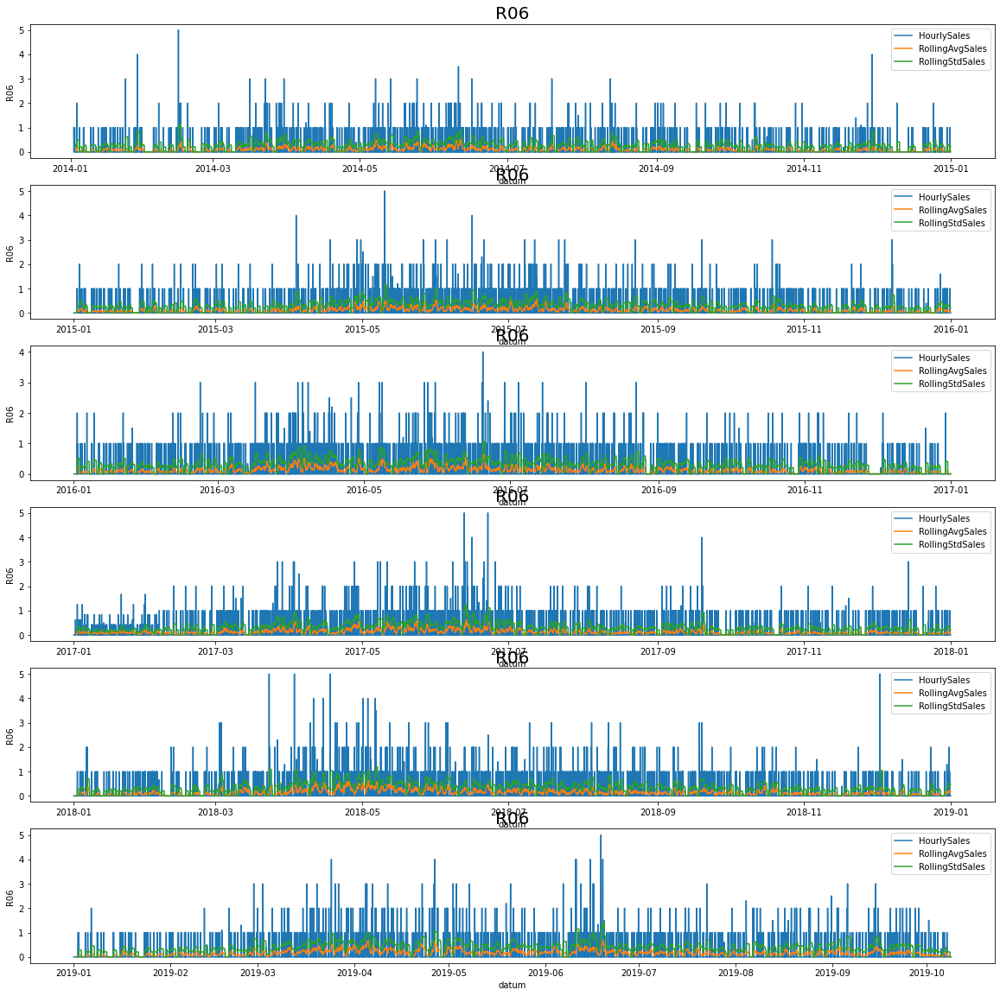

In [6]:
for col in cols:
    rolling_avg_graph(data,col)

## Seasonal Decompose

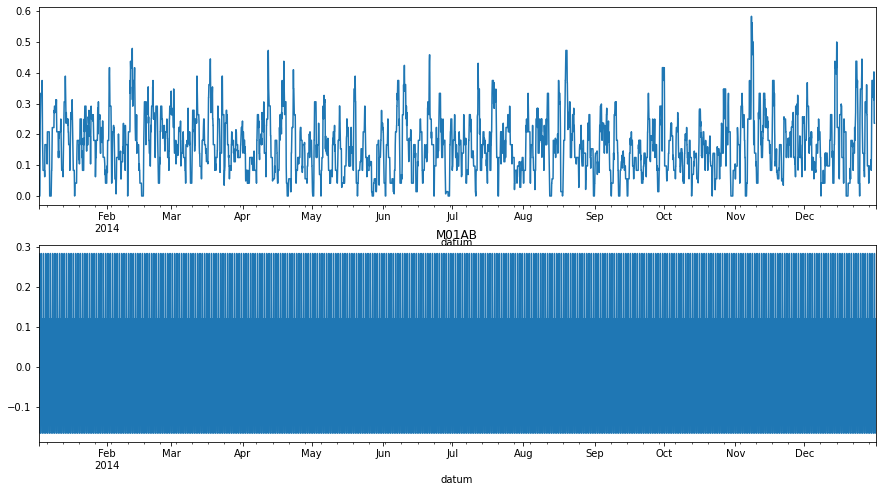

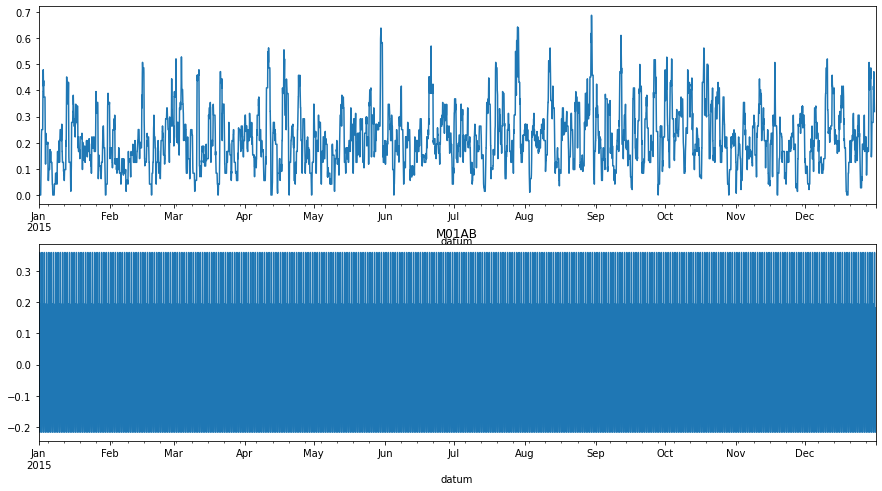

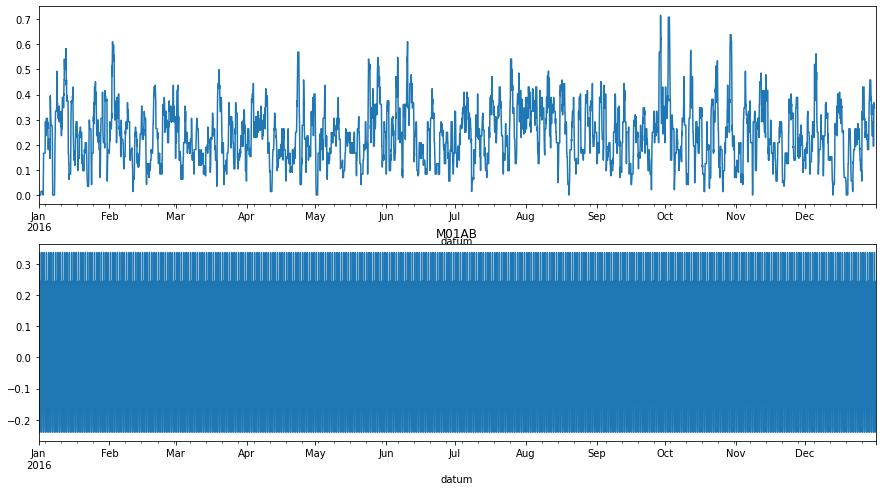

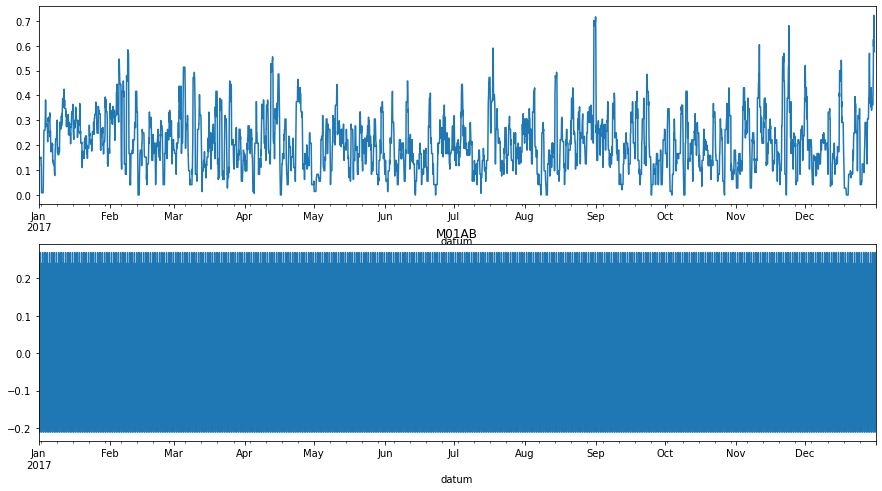

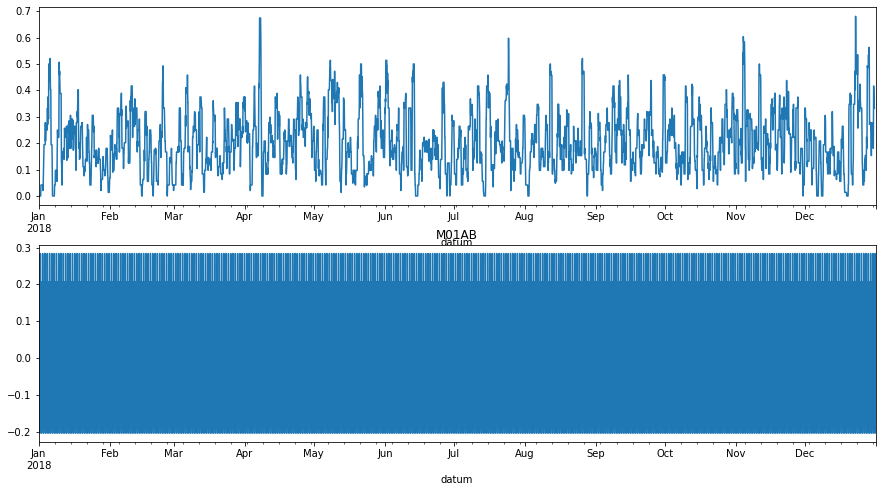

...

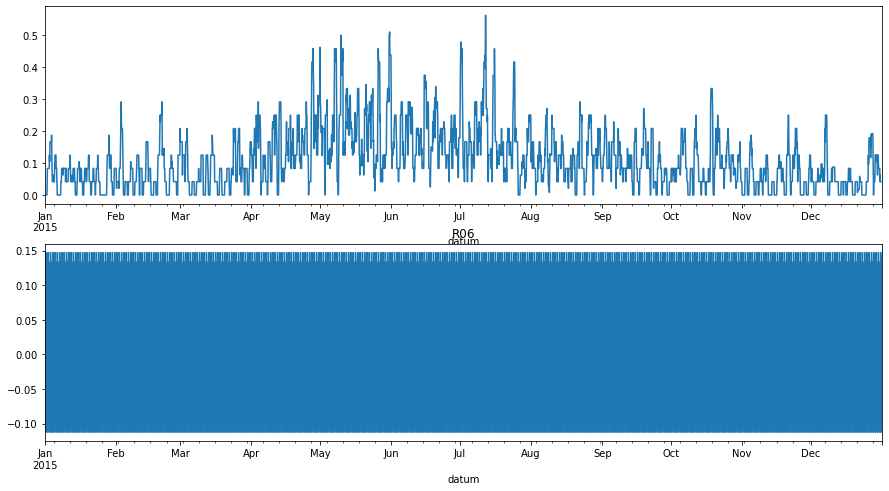

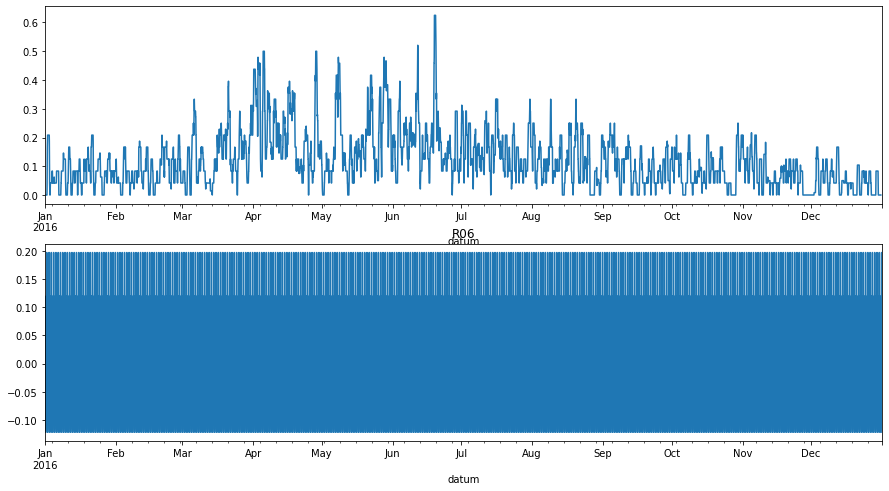

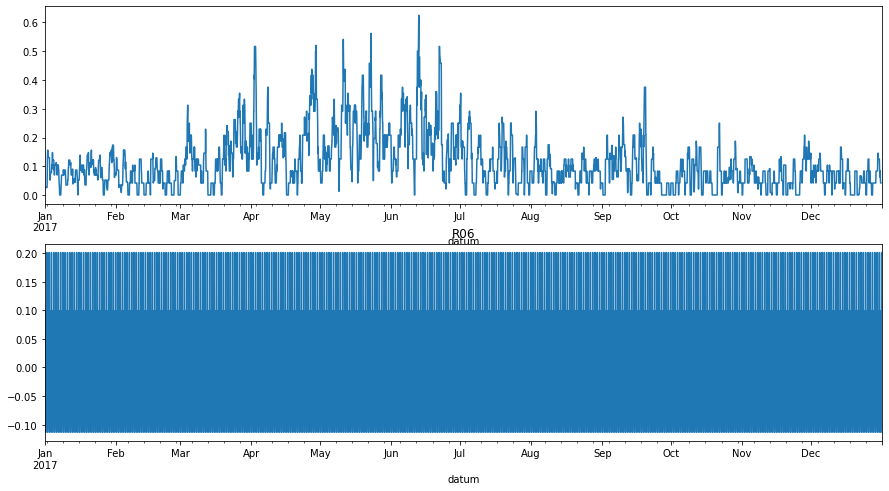

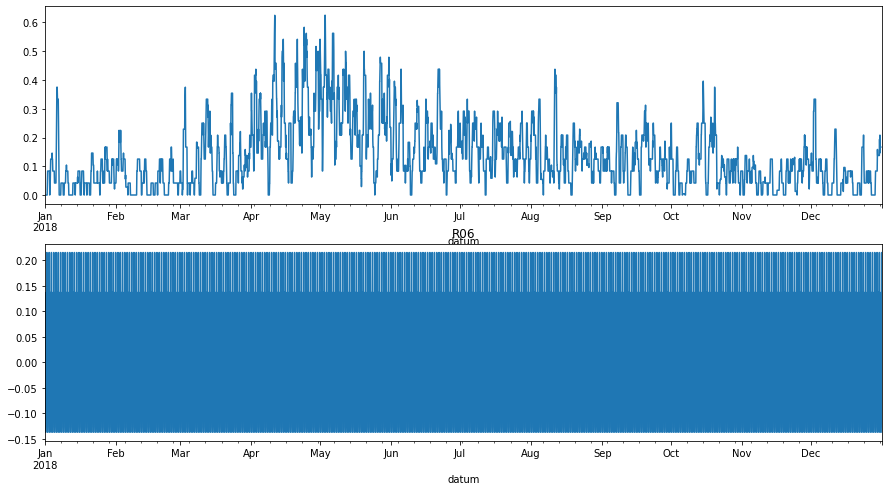

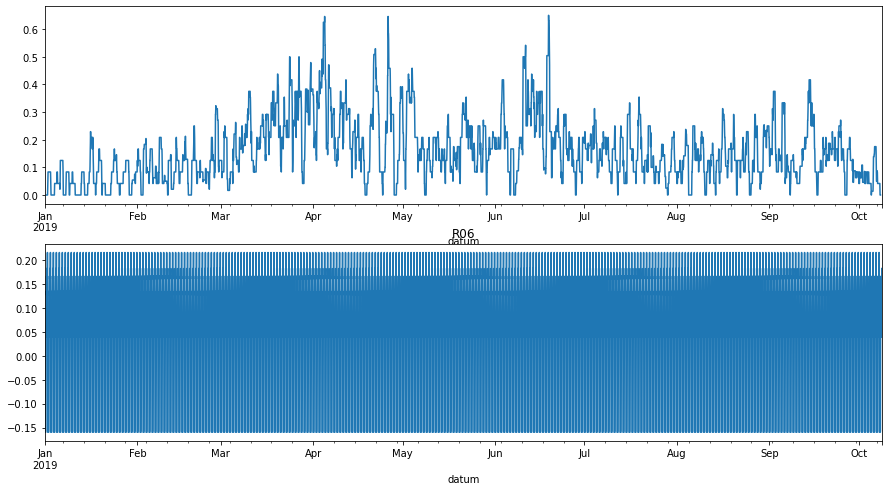

In [14]:
def seasonal_graph(data,col):
    for year in years:
        year_mask = data['Year'] == year
        mask_data = data[year_mask]
        res = seasonal_decompose(mask_data[col],model='additive')
        fig, (ax1,ax2) = plt.subplots(2,1, figsize=(15,8))
        res.trend.plot(ax=ax1)
        res.seasonal.plot(ax=ax2)
        plt.title(col)
for col in cols:
    seasonal_graph(data,col)

## ADF Test

In [8]:
for col in cols:
    print(col)
    X = data[col]
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    if(result[1] <= 0.05):
        print('\tReject Null Hypothesis : Stationary\n')
    else :
        print('\tAccept Null Hypothesis : Non-Stationary\n')

M01AB
ADF Statistic: -27.314636
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

M01AE
ADF Statistic: -26.426449
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

N02BA
ADF Statistic: -25.445070
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

N02BE
ADF Statistic: -17.849555
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

N05B
ADF Statistic: -22.390921
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

N05C
ADF Statistic: -30.013682
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

R03
ADF Statistic: -25.395960
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
	Reject Null Hypothesis : Stationary

R06
ADF St

## Exponential Smoothing

## M01AB 

<AxesSubplot:xlabel='datum'>

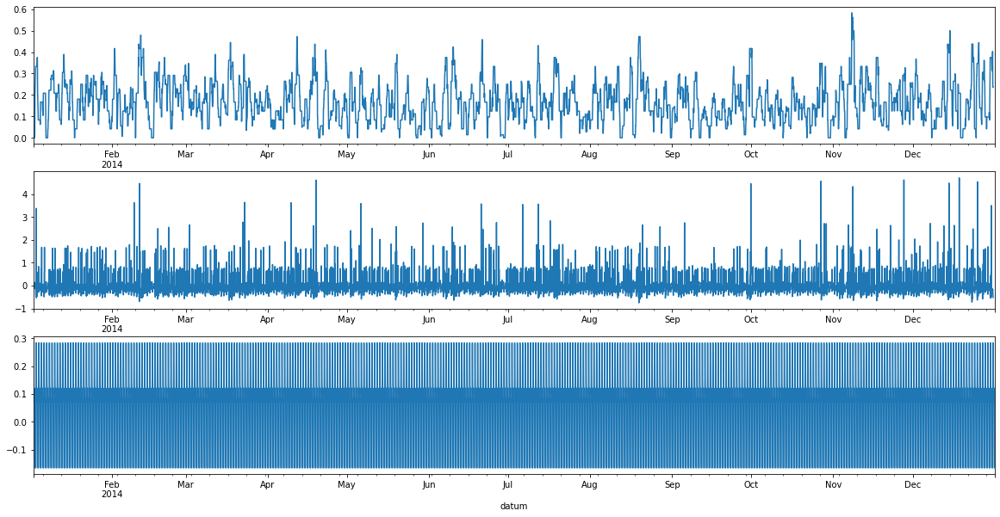

In [7]:
mask = data['Year'] == 2014
mask_data = data[mask]
res = seasonal_decompose(mask_data["M01AB"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [3]:
df = data.loc[:,['M01AB']]
train = df[:-24]
test = df[-24:]

In [34]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=24,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

In [35]:
predict = np.array(predict)
predict.reshape(1,24)

array([[0.27370047, 0.0179991 , 0.0158982 , 0.01589398, 0.01588581,
        0.01587976, 0.01587367, 0.01586454, 0.01585347, 0.01585128,
        0.03187312, 0.29285218, 0.37596611, 0.46360236, 0.44722018,
        0.45130376, 0.40763577, 0.4390052 , 0.3365513 , 0.29615618,
        0.31074228, 0.3885276 , 0.46678117, 0.44087407]])

In [36]:
real = np.array(test['M01AB'])
real

array([0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.33, 0.  ,
       0.  , 0.  ])

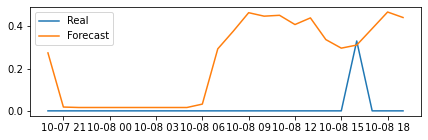

In [37]:

fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [38]:
rmse = math.sqrt(mean_squared_error(real,predictions))
print(rmse)

0.29207846379264724


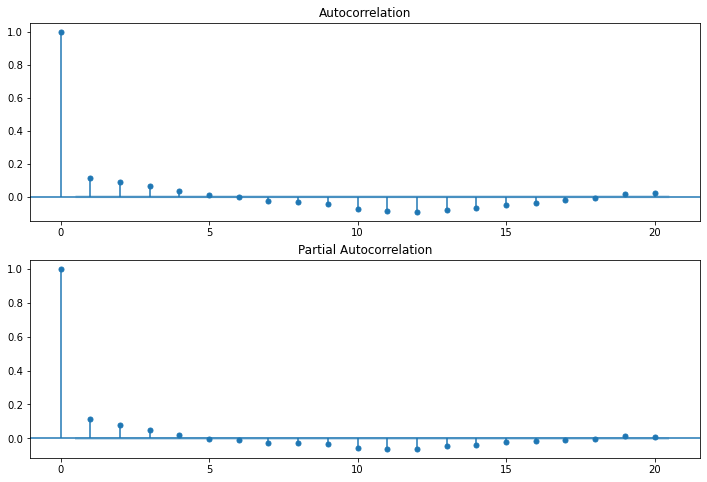

In [3]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AB"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AB"],lags=20,ax=ax2)

In [4]:
stepwise_fit = auto_arima(data['M01AB'],trace = True,suppress_warnings=True,start_p=0,max_p=5,start_q=0,max_q=5,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=84083.836, Time=10.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=83444.258, Time=3.93 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=83531.642, Time=10.88 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=90807.783, Time=4.78 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=83137.033, Time=6.39 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=83025.244, Time=7.81 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=83007.694, Time=9.15 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=83009.446, Time=11.05 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=83009.579, Time=29.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=83013.470, Time=58.83 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=83011.565, Time=36.54 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=85899.011, Time=4.99 sec

Best model:  ARIMA(4,0,0)(0,0,0)[0] intercept
Total fit time: 194.272 seconds


In [5]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
print(start , end)
model = ARIMA(train,order=(4,0,0))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(4,0,0))
    model = model.fit()
    
    pred = model.predict(start = start,end = end-1,typ='levels')
    
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
    
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

50485 50486
                              ARMA Model Results                              
Dep. Variable:                  M01AB   No. Observations:                50508
Model:                     ARMA(4, 0)   Log Likelihood              -41488.973
Method:                       css-mle   S.D. of innovations              0.550
Date:                Thu, 03 Jun 2021   AIC                          82989.945
Time:                        11:06:16   BIC                          83042.925
Sample:                    01-02-2014   HQIC                         83006.533
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.2099      0.003     65.528      0.000       0.204       0.216
ar.L1.M01AB     0.0989      0.004     22.227      0.000       0.090       0.108
ar.L2.M01AB     0.0717      0.004   

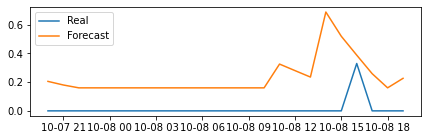

In [6]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [7]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.253377531031767


In [ ]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(1,0,1),seasonal_order=(2,0,0,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

In [ ]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [ ]:
rmse = math.sqrt(mean_squared_error(real,predictions))
print(rmse)

## M01AE

<AxesSubplot:xlabel='datum'>

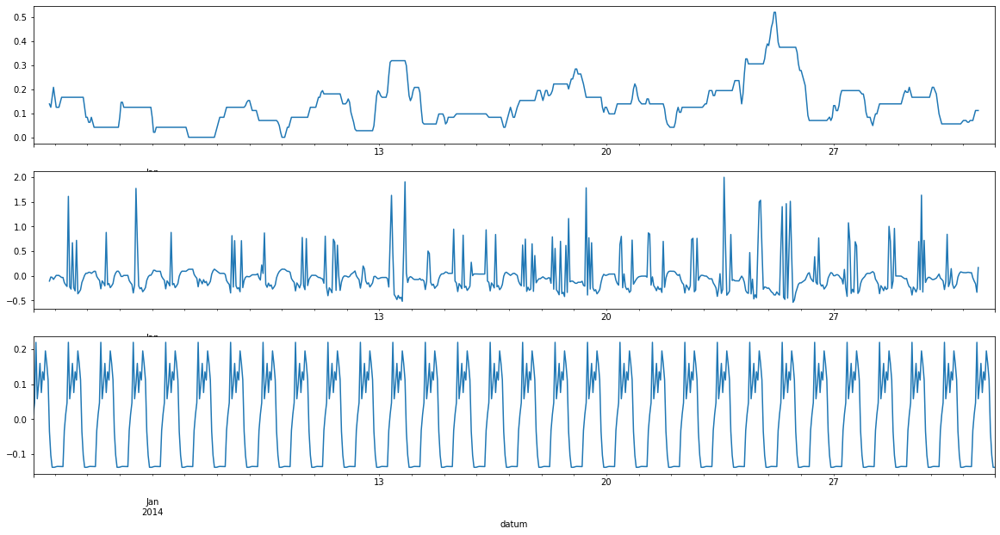

In [40]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["M01AE"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [16]:
df = data.loc[:,['M01AE']]
train = df[:-24]
test = df[-24:]

In [45]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=24,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

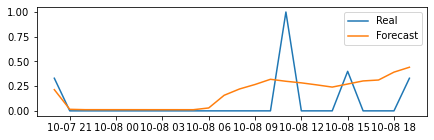

In [46]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [48]:
mape = mean_absolute_percentage_error(test,predictions)
print(mape)

543895878678970.0


In [47]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.2356104535202434


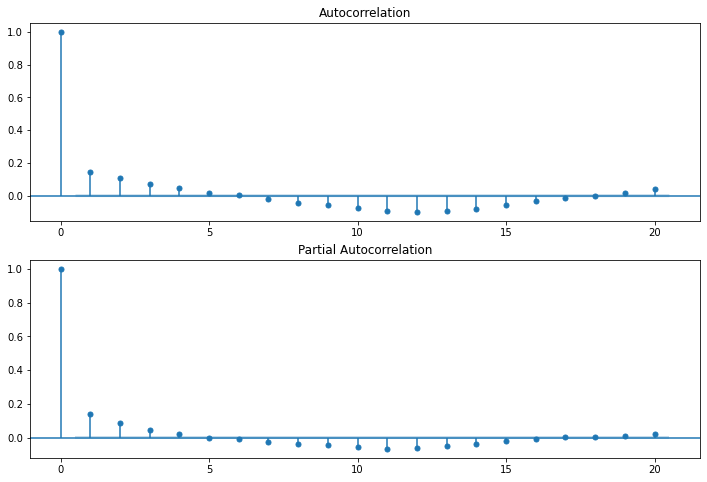

In [11]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AE"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AE"],lags=20,ax=ax2)

In [12]:
stepwise_fit = auto_arima(data['M01AE'],trace = True,suppress_warnings=True,start_p=0,max_p=5,start_q=0,max_q=5,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=54792.814, Time=10.73 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=53764.518, Time=3.93 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=53922.630, Time=28.40 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=61952.364, Time=4.79 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=53375.632, Time=10.64 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=53270.287, Time=13.00 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=53243.402, Time=13.28 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=53244.411, Time=15.82 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=53244.889, Time=35.60 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=53253.772, Time=86.16 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=53246.633, Time=39.33 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=56067.221, Time=5.87 sec

Best model:  ARIMA(4,0,0)(0,0,0)[0] intercept
Total fit time: 267.664 seconds


In [18]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
print(start , end)
model = ARIMA(train,order=(4,0,0))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(4,0,0))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

50485 50486
                              ARMA Model Results                              
Dep. Variable:                  M01AE   No. Observations:                50508
Model:                     ARMA(4, 0)   Log Likelihood              -26611.059
Method:                       css-mle   S.D. of innovations              0.410
Date:                Fri, 28 May 2021   AIC                          53234.118
Time:                        08:15:11   BIC                          53287.097
Sample:                    01-02-2014   HQIC                         53250.705
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1624      0.003     64.905      0.000       0.158       0.167
ar.L1.M01AE     0.1245      0.004     27.979      0.000       0.116       0.133
ar.L2.M01AE     0.0799      0.004   

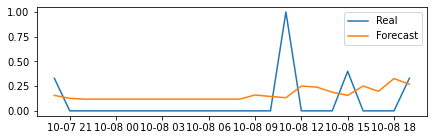

In [19]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

## N02BA

<AxesSubplot:xlabel='datum'>

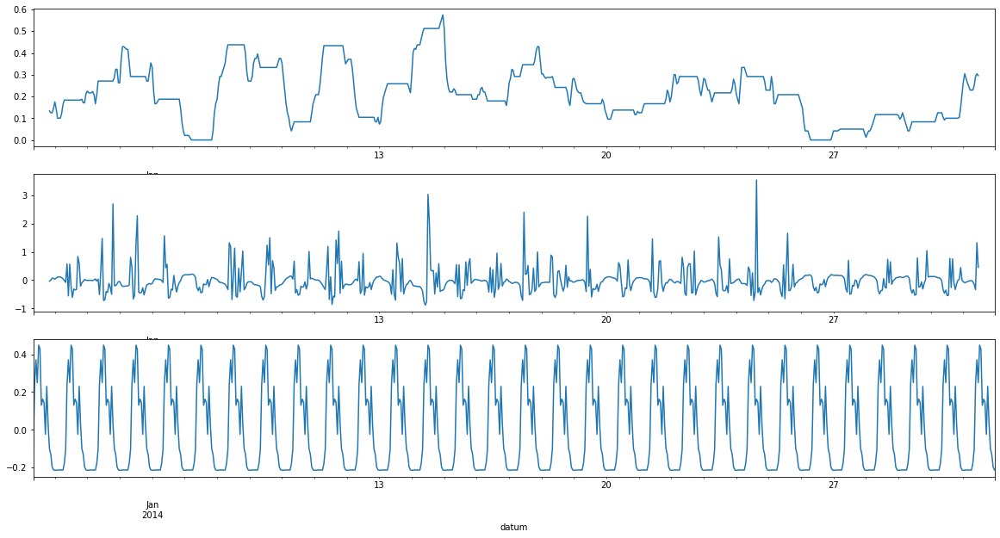

In [49]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["N02BA"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [25]:
df = data.loc[:,['N02BA']]
train = df[:-24]
test = df[-24:]

In [51]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=24,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

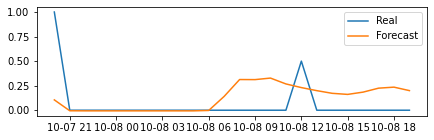

In [52]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [53]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.2534577077205581


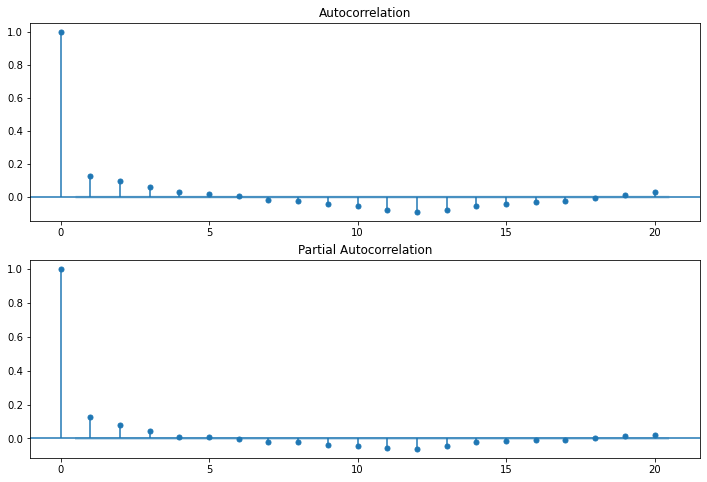

In [20]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["N02BA"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["N02BA"],lags=20,ax=ax2)

In [22]:
stepwise_fit = auto_arima(data['N02BA'],trace = True,suppress_warnings=True,start_p=0,max_p=5,start_q=0,max_q=5,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=63424.859, Time=9.92 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=62581.400, Time=6.76 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=62700.442, Time=13.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=69479.516, Time=4.32 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=62259.925, Time=6.40 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=62167.524, Time=9.92 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=62165.170, Time=11.35 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=62165.150, Time=13.27 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=62167.062, Time=40.31 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=62166.497, Time=121.91 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=64673.775, Time=7.16 sec

Best model:  ARIMA(5,0,0)(0,0,0)[0] intercept
Total fit time: 244.507 seconds


In [27]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(5,0,0))

for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(5,0,0))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                  N02BA   No. Observations:                50508
Model:                     ARMA(5, 0)   Log Likelihood              -31069.669
Method:                       css-mle   S.D. of innovations              0.448
Date:                Fri, 28 May 2021   AIC                          62153.339
Time:                        09:05:11   BIC                          62215.148
Sample:                    01-02-2014   HQIC                         62172.691
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.1618      0.003     61.330      0.000       0.157       0.167
ar.L1.N02BA     0.1146      0.004     25.761      0.000       0.106       0.123
ar.L2.N02BA     0.0737      0.004     16.459    

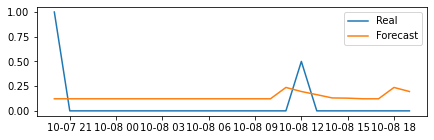

In [28]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

## N02BE

<AxesSubplot:xlabel='datum'>

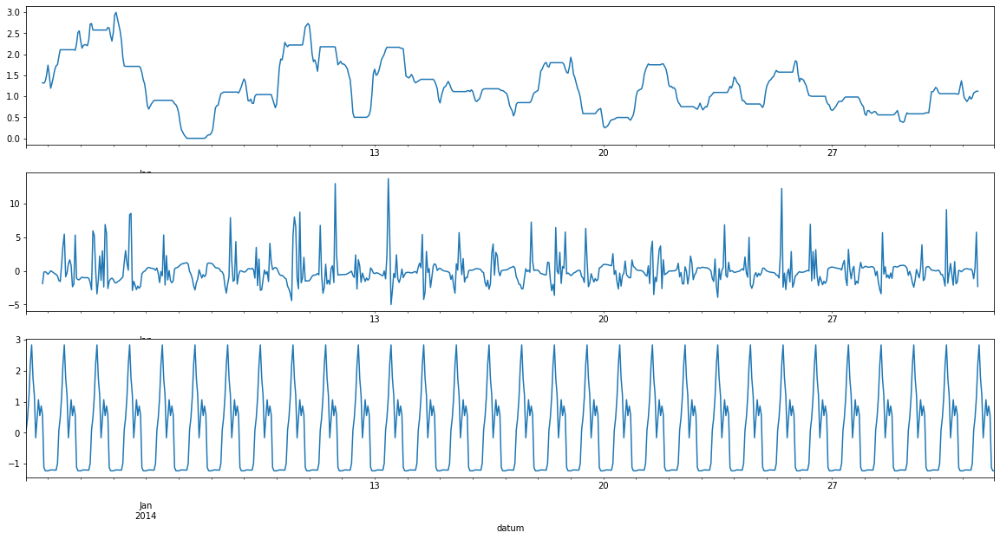

In [54]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["N02BE"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [5]:
df = data.loc[:,['N02BE']]
train = df[:-24]
test = df[-24:]

In [56]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=24,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

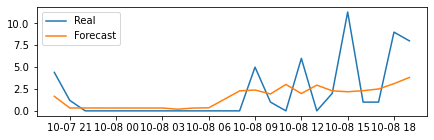

In [57]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [58]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

2.865542454934298


In [59]:
mape = mean_absolute_percentage_error(test,predictions)
print(mape)

2321717730004426.5


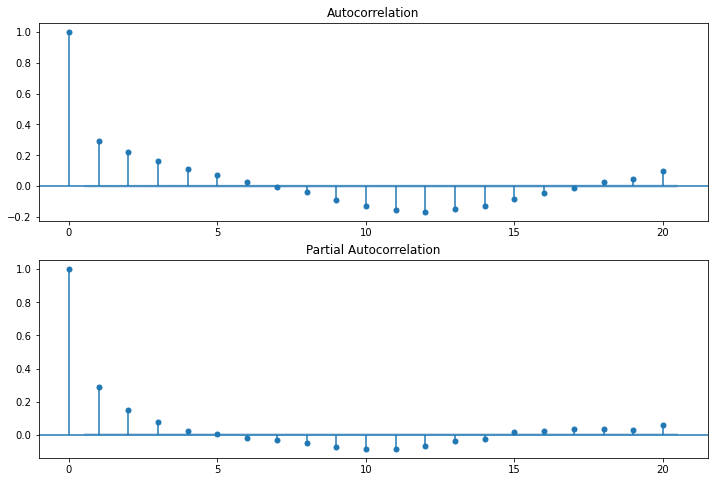

In [29]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["N02BE"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["N02BE"],lags=20,ax=ax2)

In [3]:
stepwise_fit = auto_arima(data['N02BE'],trace = True,suppress_warnings=True,start_p=0,max_p=5,start_q=0,max_q=5,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=231352.641, Time=1.76 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=226885.420, Time=1.08 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=227985.076, Time=5.46 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=243538.420, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=225759.447, Time=4.60 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=225475.763, Time=4.91 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=225453.814, Time=8.54 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=225453.756, Time=7.46 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=225452.312, Time=57.17 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=225455.185, Time=45.30 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=225447.312, Time=94.12 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=123.40 sec
 ARIMA(5,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=179.17 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=225103.400, Time=81.62 sec
 ARIMA(3,0,

In [ ]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

## N05B

<AxesSubplot:xlabel='datum'>

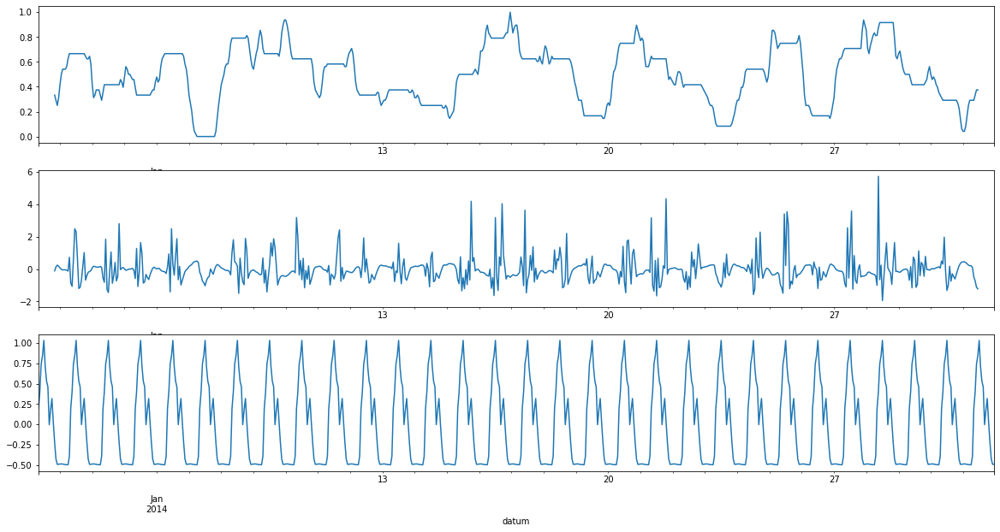

In [60]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["N05B"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [61]:
df = data.loc[:,['N05B']]
train = df[:-24]
test = df[-24:]

In [63]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=24,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

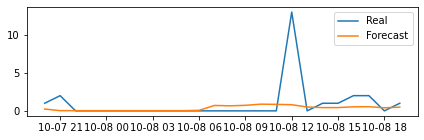

In [64]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [65]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

2.5953219471213633


## N05C

<AxesSubplot:xlabel='datum'>

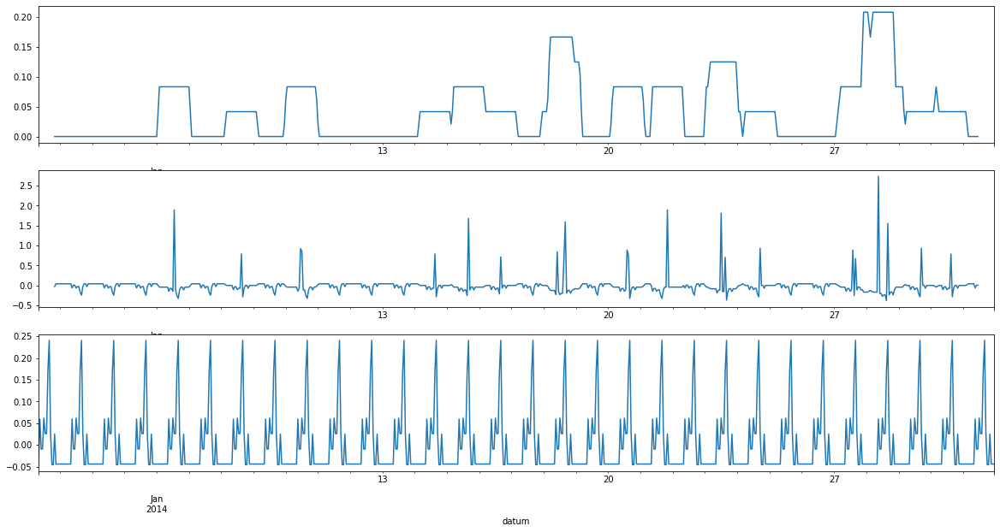

In [66]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["N05C"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [67]:
df = data.loc[:,['N05C']]
train = df[:-24]
test = df[-24:]

In [68]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=24,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

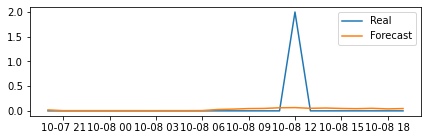

In [69]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [70]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.39626517084624074


In [71]:
mape = mean_absolute_percentage_error(test,predictions)
print(mape)

116723648125785.69


## R03

<AxesSubplot:xlabel='datum'>

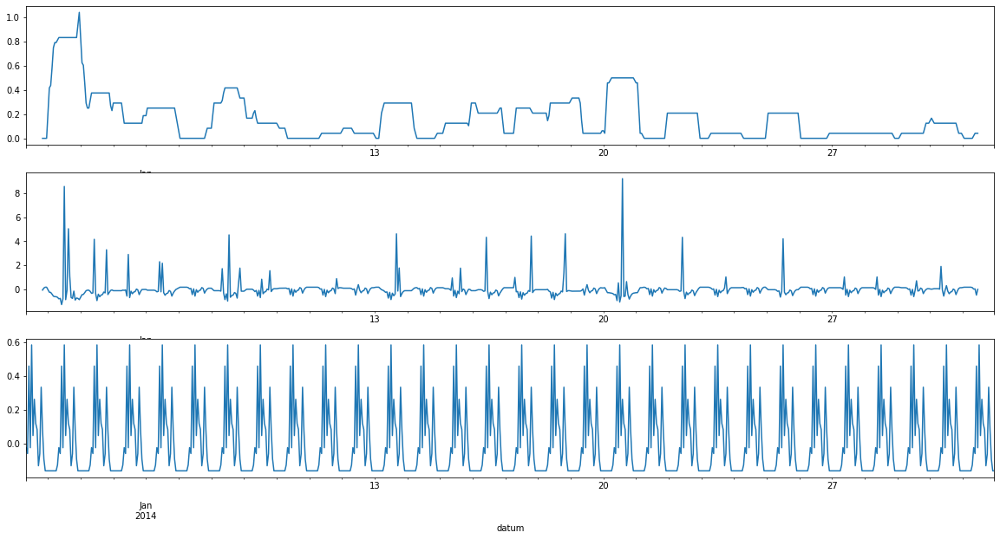

In [72]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["R03"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [73]:
df = data.loc[:,['R03']]
train = df[:-24]
test = df[-24:]

In [77]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=12,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

In [78]:
predict = np.array(predict)
predict.reshape(1,24)

array([[0.28757104, 0.1465814 , 0.13113997, 0.1158159 , 0.12751463,
        0.12371694, 0.10251095, 0.09317863, 0.10939657, 0.21085535,
        0.25640017, 0.39723338, 0.27200324, 0.15485099, 0.14768962,
        0.11743906, 0.17224023, 0.16287682, 0.14089652, 0.13089984,
        0.14426649, 0.24983135, 0.29377652, 0.43628101]])

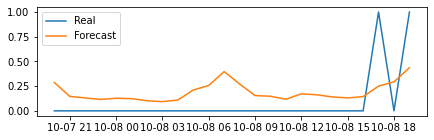

In [79]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [80]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.2645683838209309


In [81]:
mape = mean_absolute_percentage_error(test,predictions)
print(mape)

720360946046211.8


## R06

<AxesSubplot:xlabel='datum'>

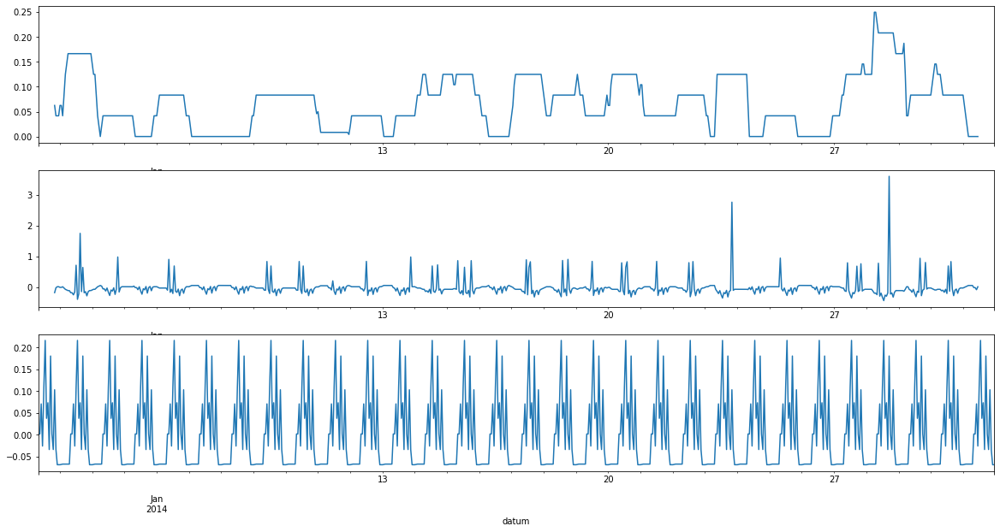

In [82]:
year_mask = data['Year'] == 2014
month_mask = data['Month'] == 1
mask_data = data[year_mask & month_mask]
res = seasonal_decompose(mask_data["R06"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(20,10))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [93]:
df = data.loc[:,['R06']]
train = df[:-24]
test = df[-24:]

In [94]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=12,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

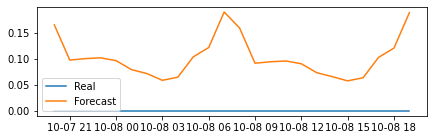

In [95]:
fig = plt.figure(figsize=(7,2))
plt.plot(test,label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [96]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.10931083658111829


In [97]:
mape = mean_absolute_percentage_error(test,predictions)
print(mape)

462057439394141.44


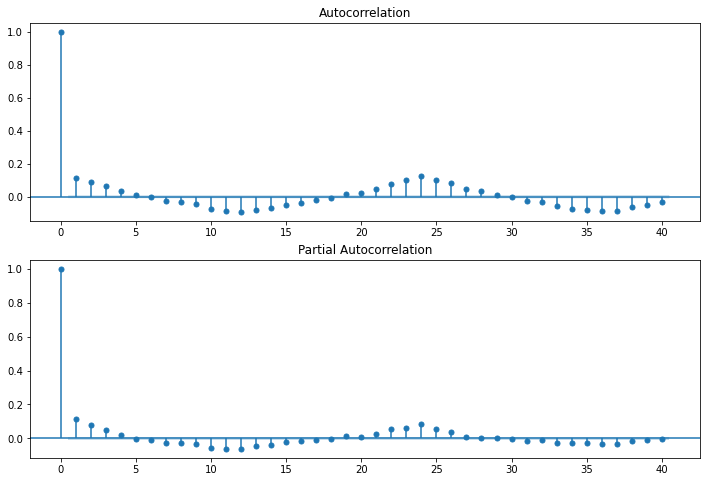

In [15]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AB"],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AB"],lags=40,ax=ax2)

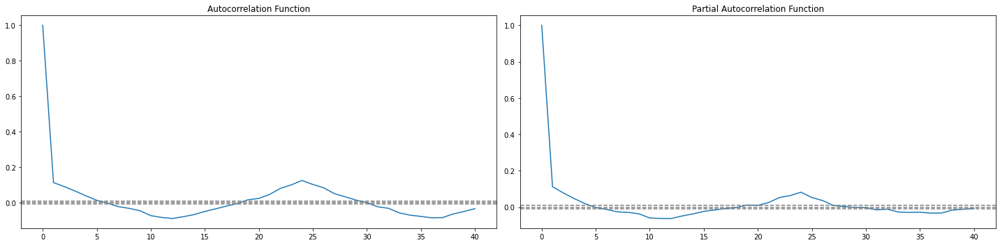

In [16]:
x = data["M01AB"].astype(float)
lag_acf = acf(x, nlags=40, fft=True)
lag_pacf = pacf(x, nlags=40, method='ols')
fig = plt.figure(figsize=(20,5))
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

In [19]:
model = ARIMA(train['M01AB'],order=(2,0,1))
model = model.fit()
model.summary()

C:\Users\dhola\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\dhola\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H wil

MemoryError: Unable to allocate 19.0 GiB for an array with shape (50451, 50451) and data type float64